# Обучение с учителем

## Подключение библиотек и скриптов

In [1]:
# 1. Основные библиотеки
import numpy as np
import pandas as pd
import pickle   # сохранение модели

import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

# 2. Разделение датасета
from sklearn.model_selection import train_test_split, KFold, GridSearchCV

# 3. Модели
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor, plot_tree
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.preprocessing import StandardScaler

# 4. Метрики качества
from sklearn.metrics import mean_squared_error as mse, r2_score as r2

# 5. Для визуализации внешних картинок в ноутбуке
from IPython.display import Image

In [3]:
import warnings
warnings.filterwarnings('ignore')
matplotlib.rcParams.update({'font.size': 14})

## Пути к директориям и файлам

In [5]:
DATASET_PATH = './housing.csv'
PREPARED_DATASET_PATH = './housing_prepared.csv'

REPORTS_FILE_PATH = './reports/'
SCALER_FILE_PATH = './models/scaler.pkl'
MODEL_FILE_PATH = './models/model.pkl'

## Загрузка данных

In [14]:
def reduce_mem_usage(df):
    """ iterate through all the columns of a dataframe and modify the data type
        to reduce memory usage.        
    """
    start_mem = df.memory_usage().sum() / 1024**2
    print('Memory usage of dataframe is {:.2f} MB'.format(start_mem))
    
    for col in df.columns:
        col_type = df[col].dtype
        
        if col_type != object:
            c_min = df[col].min()
            c_max = df[col].max()
            if str(col_type)[:3] == 'int':
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    df[col] = df[col].astype(np.int64)  
            else:
                if c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
                else:
                    df[col] = df[col].astype(np.float64)
        else:
            df[col] = df[col].astype('category')

    end_mem = df.memory_usage().sum() / 1024**2
    print('Memory usage after optimization is: {:.2f} MB'.format(end_mem))
    print('Decreased by {:.1f}%'.format(100 * (start_mem - end_mem) / start_mem))
    
    return df

In [15]:
df = pd.read_csv(PREPARED_DATASET_PATH, sep=';')

In [16]:
df = reduce_mem_usage(df)
df.head()

Memory usage of dataframe is 3.20 MB
Memory usage after optimization is: 1.23 MB
Decreased by 61.4%


,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity,...,bedroom_share,population_per_room,<1H OCEAN,INLAND,ISLAND,NEAR BAY,NEAR OCEAN,age_binary_cat,city,many_bedrooms
0,-122.230003,37.880001,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY,...,14.659091,0.365909,0.0,0.0,0.0,1.0,0.0,0,0,0
1,-122.220001,37.860001,21.0,7099.0,1106.0,2401.0,410.0,8.3014,358500.0,NEAR BAY,...,15.579659,0.338217,0.0,0.0,0.0,1.0,0.0,0,0,0
2,-122.239998,37.849998,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY,...,12.951602,0.338105,0.0,0.0,0.0,1.0,0.0,0,0,0
3,-122.250000,37.849998,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY,...,18.445839,0.437991,0.0,0.0,0.0,1.0,0.0,0,0,0
4,-122.250000,37.849998,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY,...,17.209589,0.347265,0.0,0.0,0.0,1.0,0.0,0,0,0


In [17]:
df.columns.tolist()

['longitude',
 'latitude',
 'housing_median_age',
 'total_rooms',
 'total_bedrooms',
 'population',
 'households',
 'median_income',
 'median_house_value',
 'ocean_proximity',
 'ocean_proximity_nan',
 'longitude_outlier',
 'latitude_outlier',
 'bedroom_share',
 'population_per_room',
 '<1H OCEAN',
 'INLAND',
 'ISLAND',
 'NEAR BAY',
 'NEAR OCEAN',
 'age_binary_cat',
 'city',
 'many_bedrooms']

**Оставим признаки, которые необходимы для модели**

In [18]:
feature_names = ['longitude', 'latitude', 'housing_median_age', 'total_rooms', 'total_bedrooms', 'population', 
                 'households', 'median_income', '<1H OCEAN', 'INLAND', 'NEAR BAY', 'NEAR OCEAN']

target_name = 'median_house_value'

**Стандартизация признаков** 

In [20]:
feature_names_for_stand = df[feature_names].select_dtypes(include=['float32', 'float16']).columns.tolist()
feature_names_for_stand

['longitude',
 'latitude',
 'housing_median_age',
 'total_rooms',
 'total_bedrooms',
 'population',
 'households',
 'median_income',
 '<1H OCEAN',
 'INLAND',
 'NEAR BAY',
 'NEAR OCEAN']

In [21]:
scaler = StandardScaler()
stand_features = scaler.fit_transform(df[feature_names_for_stand])

In [22]:
stand_features

array([[-1.330505  ,  1.0354127 ,  1.0123057 , ..., -0.70466506,
         2.8922615 , -0.375568  ],
       [-1.3255165 ,  1.0261123 , -0.58724904, ..., -0.70466506,
         2.8922615 , -0.375568  ],
       [-1.3354897 ,  1.0214614 ,  1.8920606 , ..., -0.70466506,
         2.8922615 , -0.375568  ],
       ...,
       [-0.82178164,  1.784071  , -0.82718223, ...,  1.4191139 ,
        -0.3457502 , -0.375568  ],
       [-0.876644  ,  1.75617   , -0.82718223, ...,  1.4191139 ,
        -0.3457502 , -0.375568  ],
       [-0.8367434 ,  1.7282691 , -0.9871377 , ...,  1.4191139 ,
        -0.3457502 , -0.375568  ]], dtype=float32)

In [23]:
stand_features.shape

(18234, 12)

In [24]:
df[feature_names_for_stand] = pd.DataFrame(stand_features, columns=feature_names_for_stand)

In [25]:
df.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity,...,bedroom_share,population_per_room,<1H OCEAN,INLAND,ISLAND,NEAR BAY,NEAR OCEAN,age_binary_cat,city,many_bedrooms
0,-1.330505,1.035413,1.012306,-1.137517,-0.973897,-0.977196,-1.623851,2.961002,452600.0,NEAR BAY,...,14.659091,0.365909,-0.881979,-0.704665,0.0,2.892262,-0.375568,0,0,0
1,-1.325516,1.026112,-0.587249,3.454696,1.345559,0.840050,0.097941,2.945842,358500.0,NEAR BAY,...,15.579659,0.338217,-0.881979,-0.704665,0.0,2.892262,-0.375568,0,0,0
2,-1.335490,1.021461,1.892061,-0.704066,-0.829080,-0.825104,-1.314656,2.280839,352100.0,NEAR BAY,...,12.951602,0.338105,-0.881979,-0.704665,0.0,2.892262,-0.375568,0,0,0
3,-1.340478,1.021461,1.892061,-0.846581,-0.722247,-0.770910,-1.060025,1.252570,341300.0,NEAR BAY,...,18.445839,0.437991,-0.881979,-0.704665,0.0,2.892262,-0.375568,0,0,0
4,-1.340478,1.021461,1.892061,-0.585920,-0.615414,-0.764791,-0.817519,0.107990,342200.0,NEAR BAY,...,17.209589,0.347265,-0.881979,-0.704665,0.0,2.892262,-0.375568,0,0,0


## Разбиение на train / test

In [27]:
X = df[feature_names]
y = df[target_name]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, shuffle=True, random_state=12)

## Построение моделей

In [28]:
def evaluate_preds(true_values, pred_values, save=False):
    """Оценка качества модели и график preds vs true"""
    
    print("R2:\t" + str(round(r2(true_values, pred_values), 3)) + "\n" +
          "RMSE:\t" + str(round(np.sqrt(mse(true_values, pred_values)), 3)) + "\n" +
          "MSE:\t" + str(round(mse(true_values, pred_values), 3))
         )
    
    plt.figure(figsize=(8,8))
    
    sns.scatterplot(x=pred_values, y=true_values)
    plt.plot([0, 500000], [0, 500000], linestyle='--', color='black')  # диагональ, где true_values = pred_values
    
    plt.xlabel('Predicted values')
    plt.ylabel('True values')
    plt.title('True vs Predicted values')
    
    if save == True:
        plt.savefig(REPORTS_FILE_PATH + 'report.png')
    plt.show()

### Линейная регрессия

R2:	0.626
RMSE:	59266.746
MSE:	3512547220.468


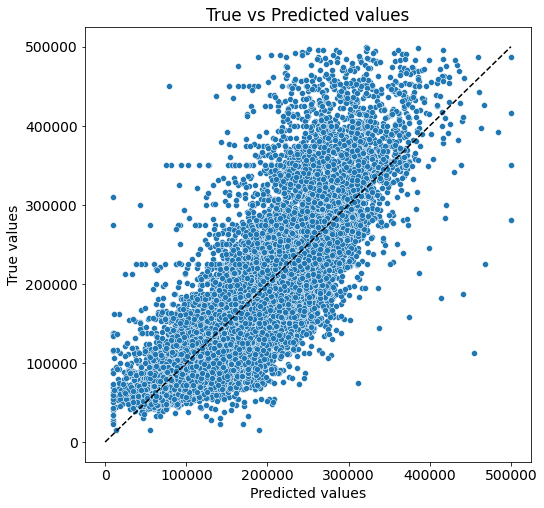

In [29]:
lr_model = LinearRegression()
lr_model.fit(X_train, y_train)

y_train_preds = lr_model.predict(X_train)
# Постпроцессинг
y_train_preds = np.clip(y_train_preds, a_min=10000, a_max=500000)

evaluate_preds(y_train, y_train_preds)

R2:	0.607
RMSE:	60995.071
MSE:	3720398632.429


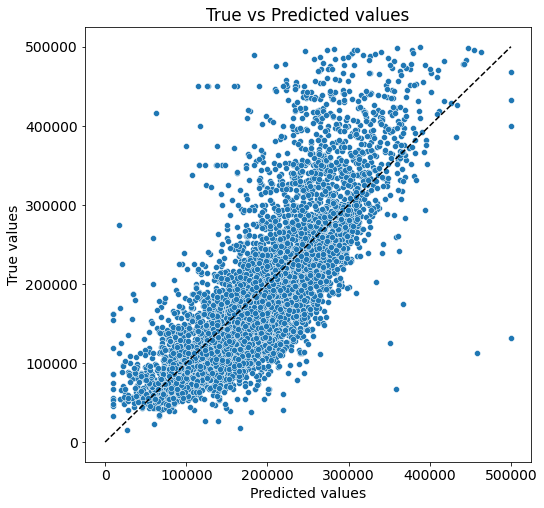

In [30]:
y_test_preds = lr_model.predict(X_test)

# Постпроцессинг
y_test_preds = np.clip(y_test_preds, a_min=10000, a_max=500000)

evaluate_preds(y_test, y_test_preds)

### Деревья решений

R2:	1.0
RMSE:	0.0
MSE:	0.0


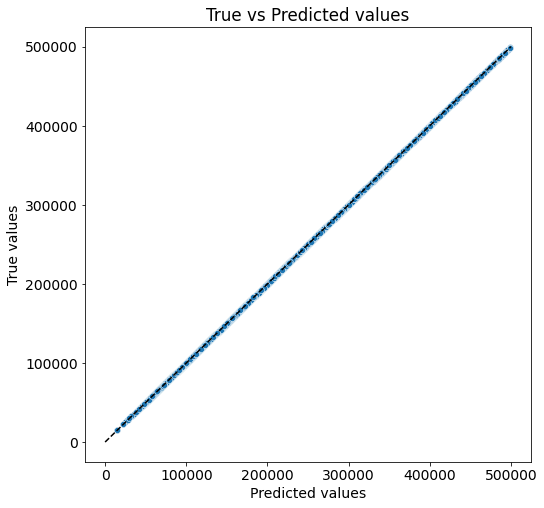

In [31]:
dt_model = DecisionTreeRegressor(criterion='mse', 
                                 max_depth=400, # глубина дерева  
                                 min_samples_leaf=1, # минимальное кол-во наблюдений в листе дерева
                                 random_state=42)
dt_model.fit(X_train, y_train)

y_train_preds = dt_model.predict(X_train)
evaluate_preds(y_train, y_train_preds)

R2:	0.574
RMSE:	63577.974
MSE:	4042158739.975


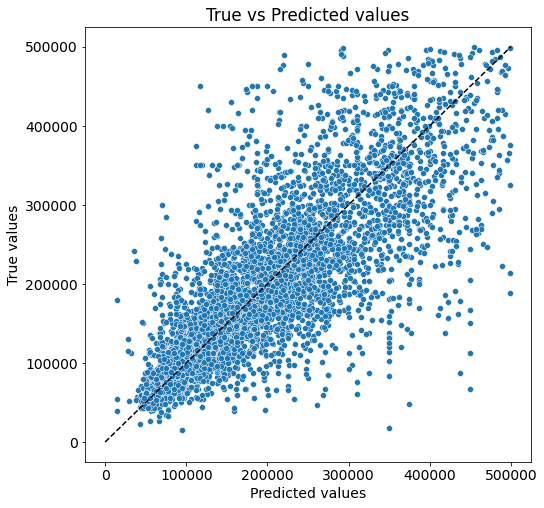

In [32]:
y_test_preds = dt_model.predict(X_test)
evaluate_preds(y_test, y_test_preds)

### Случайный лес

R2:	0.77
RMSE:	46500.145
MSE:	2162263468.057


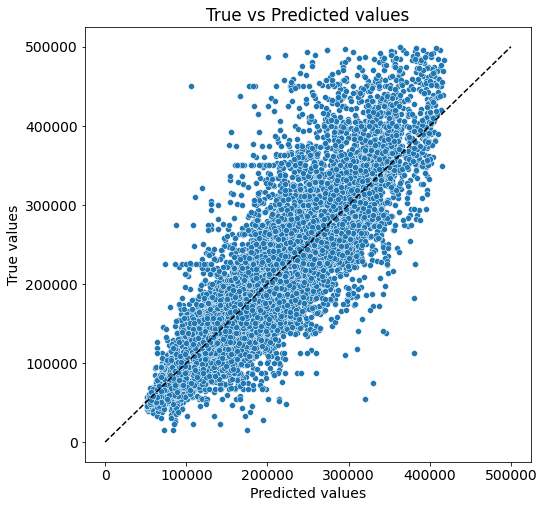

In [34]:
rf_model = RandomForestRegressor(criterion='mse',
                                 max_depth=20, # глубина дерева  
                                 min_samples_leaf=30, # минимальное кол-во наблюдений в листе дерева
                                 random_state=42,
                                 n_estimators=100  # кол-во деревьев
                                 )

rf_model.fit(X_train, y_train)
y_train_preds = rf_model.predict(X_train)
evaluate_preds(y_train, y_train_preds)

R2:	0.724
RMSE:	51181.14
MSE:	2619509131.089


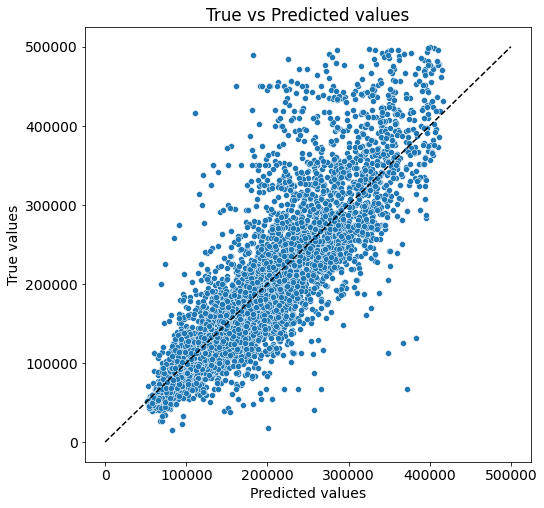

In [35]:
y_test_preds = rf_model.predict(X_test)
evaluate_preds(y_test, y_test_preds)

## Градиентный бустинг. Решающие деревья.

R2:	0.896
RMSE:	31205.192
MSE:	973764001.047


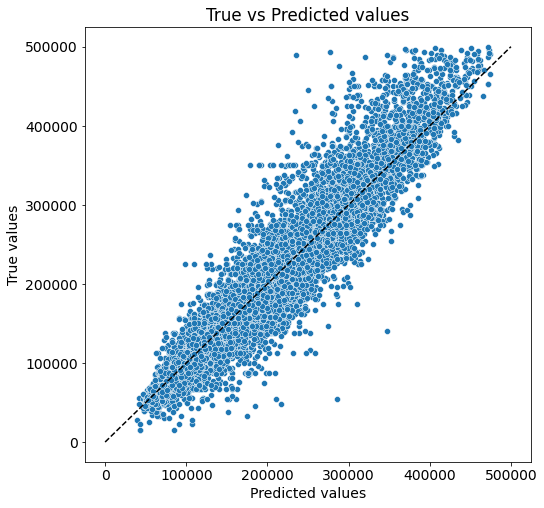

In [36]:
gb_model = GradientBoostingRegressor(criterion='mse',
                                     max_depth=7,
                                     min_samples_leaf=10,
                                     random_state=42,  
                                     n_estimators=100)
gb_model.fit(X_train, y_train)

y_train_preds = gb_model.predict(X_train)
evaluate_preds(y_train, y_train_preds)

R2:	0.801
RMSE:	43377.211
MSE:	1881582465.619


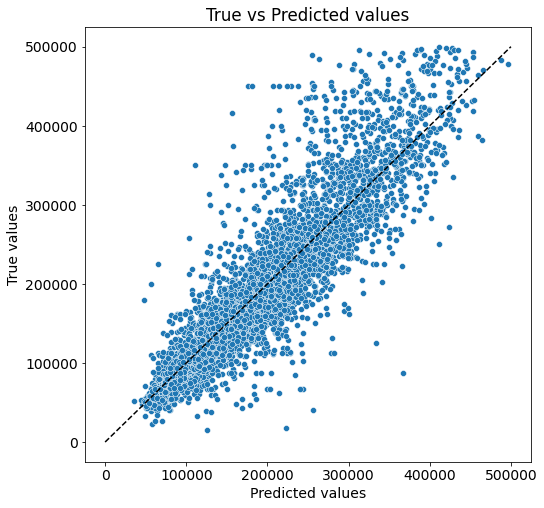

In [37]:
y_test_preds = gb_model.predict(X_test)
evaluate_preds(y_test, y_test_preds)

# Выводы

По результатам анализа можно сказать, что лучшей моделью для данной задачи будет Градиентный бустинг.